<a href="https://colab.research.google.com/github/MarkoArsenovic/PPPO2021/blob/main/Vezbe08.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Vežbe 08** Klasifikacija fotografije

## Sadržaj

1. Uvod
2. Klasifikacija fotografija sa *scikit-learn* (HOG + logistička regresija)
3. Gabor filter banke za klasifikaciju tekstura
4. Klasifikacija fotografije pomoću VGG-19 / Inception V3 / MobileNet / ResNet101
5. Klasifikacija fotografija uz fino podešavanje + *transfer learning*
6. Klasifikacija saobraćajnih znakova pomoću *deep learning*-a
7. Procena ljudske poze pomoću *deep learning*-a


### Uvod

Klasifikacija fotografija predstavlja nadgledani zadatak mašinskog učenja dodeljivanja (najverovatnije) oznake ulaznoj fotografiji iz fiksnog skupa oznaka (kategorija). Ovo je jedan od osnovnih problema u obradi fotografija koji ima veliki broj praktičnih primena. Štaviše, mnogi drugi naizgled različiti zadaci obrade fotografija (poput otkrivanja i segmentacije objekata) mogu se svesti na klasifikaciju fotografija. 

Klasifikacija fotografija odnosi se na postupak dodeljivanja oznake (odnosno klasifikovanja) fotografiji na osnovu njenog vizuelnog sadržaja. Na primer, može se razviti algoritam binarne klasifikacije fotografija (model) da bi se predvidelo da li se čovek nalazi na fotografiji.

Prikazaćemo primenu dve vrste klasifikatora fotografija. 

**Prva** se zasniva na karakteristikama, gde algoritam generisanja (pretprocesiranja) izdvaja skup karakteristika fotografije koje se koriste za njeno predstavljanje. Algoritam za klasifikaciju fotografije (klasični algoritam nadgledanog mašinskog učenja) se zatim koristi za klasifikaciju fotografije pomoću karakteristika. Sledeći dijagram prikazuje klasifikaciju fotografija zasnovanu na karakteristikama:

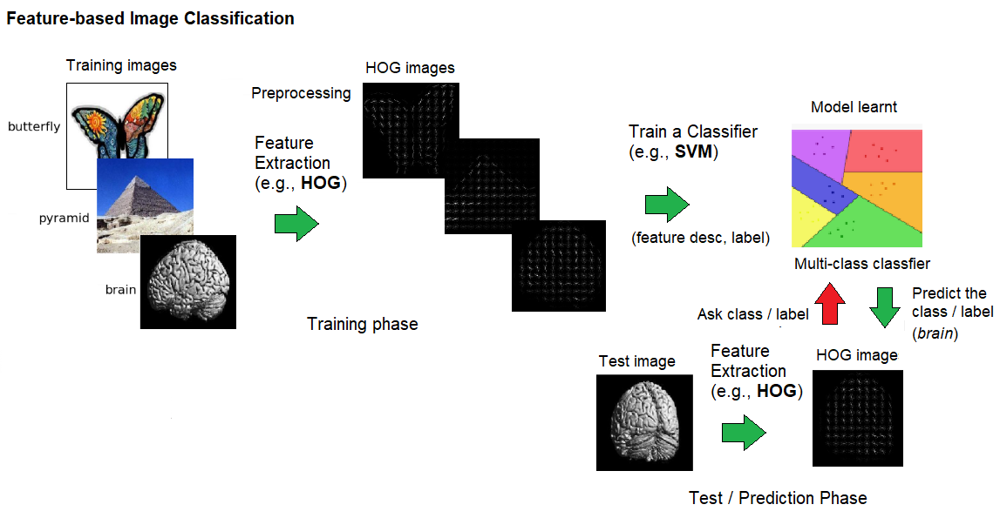

**Drugi** tip klasifikatora je klasifikator dubokog učenja gde nije implementiran nijedan korak predobrade (poput izdvajanja karakteristika), a duboka neuronska mreža od kraja do kraja je obučena za izvršavanje zadatka klasifikacije. Sledeći dijagram prikazuje duboku klasifikaciju fotografija zasnovanih na učenju (end-to-end):

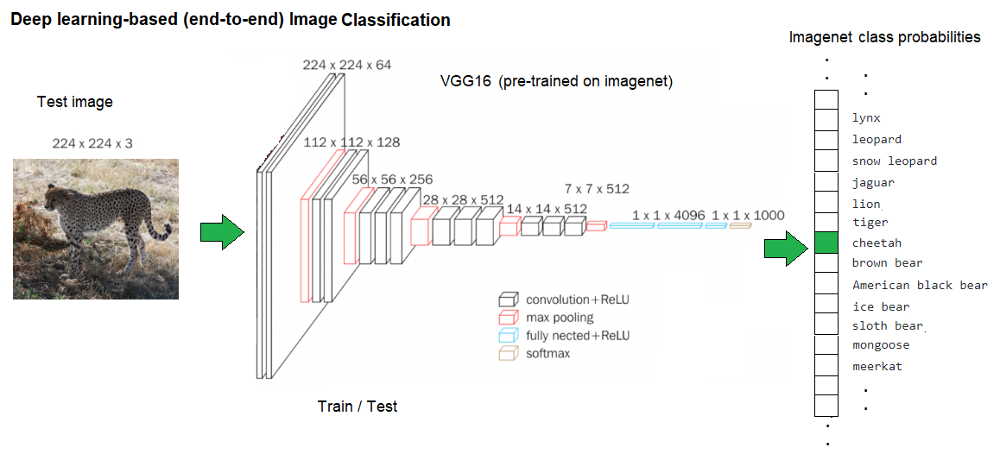

Klasifikacija fotografija je nadgledani zadatak mašinskog učenja koji se sastoji od dve faze: **treninga** i **testiranja**. 

U fazi treninga, skup označenih ulaznih fotografija (sa poznatim oznakama klase) pruža se algoritmu za klasifikaciju, koji obučava model klasifikacije koristeći ulaz (obično se uče parametri modela). 

Često se koristi skup validacionih (zadržanih) fotografija za procenu trenutnih performansi modela na neviđenim fotografijama. 

Kada se trening završi, naučeni model se može koristiti za klasifikaciju ili predviđanje oznake novih (test) fotografija - ovo je poznato kao faza testiranja. Predviđena oznaka se može uporediti sa oznakom *ground-truth* da bi se uporedila tačnost klasifikatora.

Učitavanje dataseta potrebnog za ove vežbe
- učitati images.zip
- učitati models.zip

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1sD38oh9dg6a5rovPujEG1mvF_IPmk6B7' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1sD38oh9dg6a5rovPujEG1mvF_IPmk6B7" -O images.zip && rm -rf /tmp/cookies.txt

--2021-04-27 08:15:06--  https://docs.google.com/uc?export=download&confirm=fkyM&id=1sD38oh9dg6a5rovPujEG1mvF_IPmk6B7
Resolving docs.google.com (docs.google.com)... 74.125.195.113, 74.125.195.101, 74.125.195.138, ...
Connecting to docs.google.com (docs.google.com)|74.125.195.113|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0o-6g-docs.googleusercontent.com/docs/securesc/fg6ob71ctp2u8d1vt8cbhopgjbtqnk4r/jto813tn7tka3afp9nep3t2v3qda9d7u/1619511300000/07050430151874469418/01533304334182729292Z/1sD38oh9dg6a5rovPujEG1mvF_IPmk6B7?e=download [following]
--2021-04-27 08:15:06--  https://doc-0o-6g-docs.googleusercontent.com/docs/securesc/fg6ob71ctp2u8d1vt8cbhopgjbtqnk4r/jto813tn7tka3afp9nep3t2v3qda9d7u/1619511300000/07050430151874469418/01533304334182729292Z/1sD38oh9dg6a5rovPujEG1mvF_IPmk6B7?e=download
Resolving doc-0o-6g-docs.googleusercontent.com (doc-0o-6g-docs.googleusercontent.com)... 74.125.195.132, 2607:f8b0:400e:c09::84
Connecting

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1eFinAvhus6hLJQHLnKRoSasJhB3xxDlH' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1eFinAvhus6hLJQHLnKRoSasJhB3xxDlH" -O models.zip && rm -rf /tmp/cookies.txt

--2021-04-27 08:15:12--  https://docs.google.com/uc?export=download&confirm=&id=1eFinAvhus6hLJQHLnKRoSasJhB3xxDlH
Resolving docs.google.com (docs.google.com)... 74.125.142.102, 74.125.142.113, 74.125.142.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.142.102|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-14-9g-docs.googleusercontent.com/docs/securesc/nn9cjv06nq1hfva9eptktmlkjs81lsbv/ap07ufg34m7ivsauo7dmtjtulnivoibt/1619511300000/07050430151874469418/11496058892043150381Z/1eFinAvhus6hLJQHLnKRoSasJhB3xxDlH?e=download [following]
--2021-04-27 08:15:12--  https://doc-14-9g-docs.googleusercontent.com/docs/securesc/nn9cjv06nq1hfva9eptktmlkjs81lsbv/ap07ufg34m7ivsauo7dmtjtulnivoibt/1619511300000/07050430151874469418/11496058892043150381Z/1eFinAvhus6hLJQHLnKRoSasJhB3xxDlH?e=download
Resolving doc-14-9g-docs.googleusercontent.com (doc-14-9g-docs.googleusercontent.com)... 74.125.195.132, 2607:f8b0:400e:c09::84
Connecting to 

Unzip dataseta

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
   creating: images/Caltech101_images/
   creating: images/Caltech101_images/brain/
  inflating: images/Caltech101_images/brain/1715.jpg  
  inflating: images/Caltech101_images/brain/1727.jpg  
  inflating: images/Caltech101_images/brain/1802.jpg  
   creating: images/Caltech101_images/buddha/
  inflating: images/Caltech101_images/buddha/1856.jpg  
  inflating: images/Caltech101_images/buddha/1858.jpg  
   creating: images/Caltech101_images/butterfly/
  inflating: images/Caltech101_images/butterfly/1955.jpg  
  inflating: images/Caltech101_images/butterfly/1993.jpg  
  inflating: images/Caltech101_images/butterfly/2013.jpg  
   creating: images/Caltech101_images/chair/
  inflating: images/Caltech101_images/chair/2354.jpg  
  inflating: images/Caltech101_images/chair/2355.jpg  
  inflating: images/Caltech101_images/chair/2356.jpg  
   creating: images/Caltech101_images/elephant/
  inflating: images/Caltech101_images/elephant/3268.jpg  
  inflati

In [ ]:
!unzip models.zip

Archive:  models.zip
   creating: models/
  inflating: models/imagenet_classes.txt  
  inflating: models/pose_deploy_linevec_faster_4_stages.prototxt  


### Image Classification with scikit-learn (HOG + Logistic Regression) // Klasifikacija fotografija sa *scikit-learn* (HOG + logistička regresija)

Prikazaćemo primenu klasifikatora fotografija, koji je zasnovan na karakteristikama koristeći funkcije biblioteka *scikitimage* i *scikit-learn*. 

Višeklasni klasifikator logističke regresije (*softmax* regresija) biće obučen na histogramu deskriptora orijentisanih gradijenata (HOG) izvučenim iz fotografije treninga. 

Sledeće jednačine pokazuju kako se procenjuju parametri za K-klasu *softmax* regresivnog klasifikatora u fazi treninga (npr. sa stohastičkim gradijentnim spuštanjem), a zatim se naučeni model koristi za predviđanje verovatnoće oznake klase kojoj je dat ulaz fotografija u fazi testiranja:

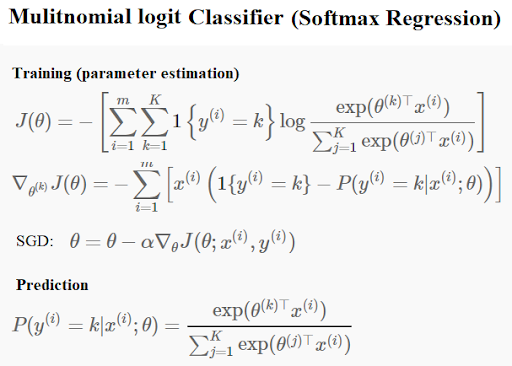

- Funkcija *hog()* koristi se za izdvajanje HOG-a za datu fotografiju. Za izračunavanje HOG-a imamo sledeće korake:
 1. (Opcionalno) Normalizujte fotografiju globalno.
 2. Izračunajte gradijentnu fotografiju.
 3. Izračunati gradijentne histograme.
 4. Izvršite normalizaciju bloka.
 5. Izravnajte se u vektor obeležja (deskriptor obeležja).

 Višekanalni parametar funkcije postavljen je na *True*, jer se poslednja dimenzija fotografije smatra kanalom u boji (RGB). Neke fotografije su bile sive (dvodimenzionalne); da bi se svaki od njih pretvorio u trodimenzionalni niz, korišćena je funkcija *gray2rgb()*.

 Funkcija vraća HOG deskriptor za ulaznu fotografiju i HOG fotografiju.

 Sravnjeni jednodimenzionalni niz vraća se kao vektor obeležja kada je parametar *feature_vector* - *True*. Vizualizacija HOG fotografije se takođe vraća ako je parametar vizualizacije postavljen na *True*.

- Funkcija *train_test_split()* koristi se za podelu skupa fotografija na nasumične podskupove treninga i testa (90% trening i 10% test) podešavanjem parametra *test_size* na 0,1.

- Instancirana je klasa *LogisticRegression* kako bi se uklopila u model klasifikatora logističke regresije (*logit*) sa skupom podataka za trening. U ovom slučaju klasifikacije više klasa, kada je parametar *multi_class* podešen na *multinomial*, koristi se unakrsni gubitak (što podržava *lbfgs solver* koji smo koristili).

- Funkcija *predict()* koristi se za predviđanje klase probne fotografije.

- Funkcije *classification_report()* i *accuracy_score()* koriste se za procenu performansi modela na skupu podataka testa (u odnosu na *ground-truth* oznake).

In [ ]:
# http://www.vision.caltech.edu/Image_Datasets/Caltech101/
# https://www.kaggle.com/manikg/training-svm-classifier-with-hog-features
%matplotlib inline
import numpy as np
from skimage.io import imread
from skimage.color import gray2rgb
from skimage.transform import resize
from skimage.feature import hog
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,accuracy_score
from glob import glob
from matplotlib import pyplot as plt

"""
Pročitajte fotografije koje odgovaraju 10 različitih klasa (one se izdvajaju u zasebne fascikle) iz odgovarajućih direktorijuma 
i izvucite HOG fotografije/deskriptore sa fotografije pomoću sledećeg koda. 
Odštampajte broj fotografija prisutnih za svaku oznaku.
"""

images, hog_images = [], []
X, y = [], []
ppc = 16
sz = 200
for dir in glob('images/Caltech101_images/*'):
    image_files = glob(dir + '/*.jpg')
    label = dir.split('\\')[-1]
    print(label, len(image_files))
    for image_file in image_files:
        image = resize(imread(image_file), (sz,sz))
        if len(image.shape) == 2: # if a gray-scale image
            image = gray2rgb(image)
        fd,hog_image = hog(image, orientations=8, pixels_per_cell=(ppc,ppc),cells_per_block=(4, 4),block_norm= 'L2',visualize=True, multichannel=True)
        images.append(image)
        hog_images.append(hog_image)
        X.append(fd)
        y.append(label)

images/Caltech101_images/pyramid 3
images/Caltech101_images/buddha 2
images/Caltech101_images/pizza 3
images/Caltech101_images/rhino 3
images/Caltech101_images/pigeon 3
images/Caltech101_images/sunflower 3
images/Caltech101_images/butterfly 3
images/Caltech101_images/chair 3
images/Caltech101_images/laptop 3
images/Caltech101_images/brain 3
images/Caltech101_images/elephant 3
images/Caltech101_images/piano 2


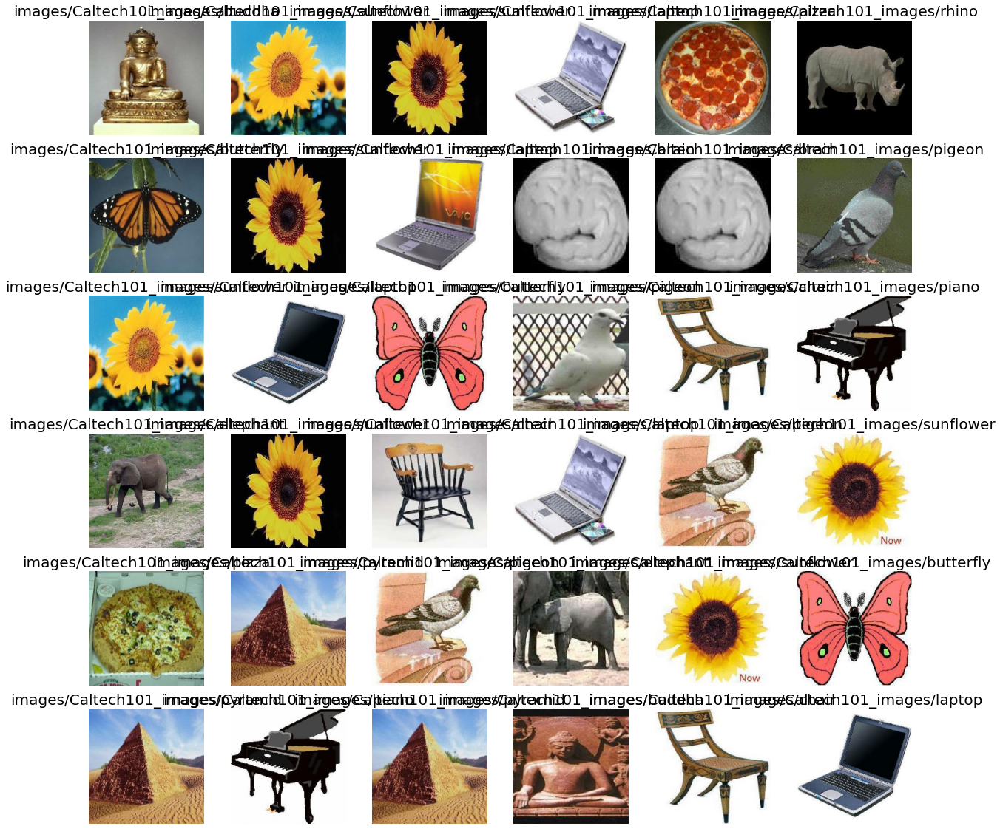

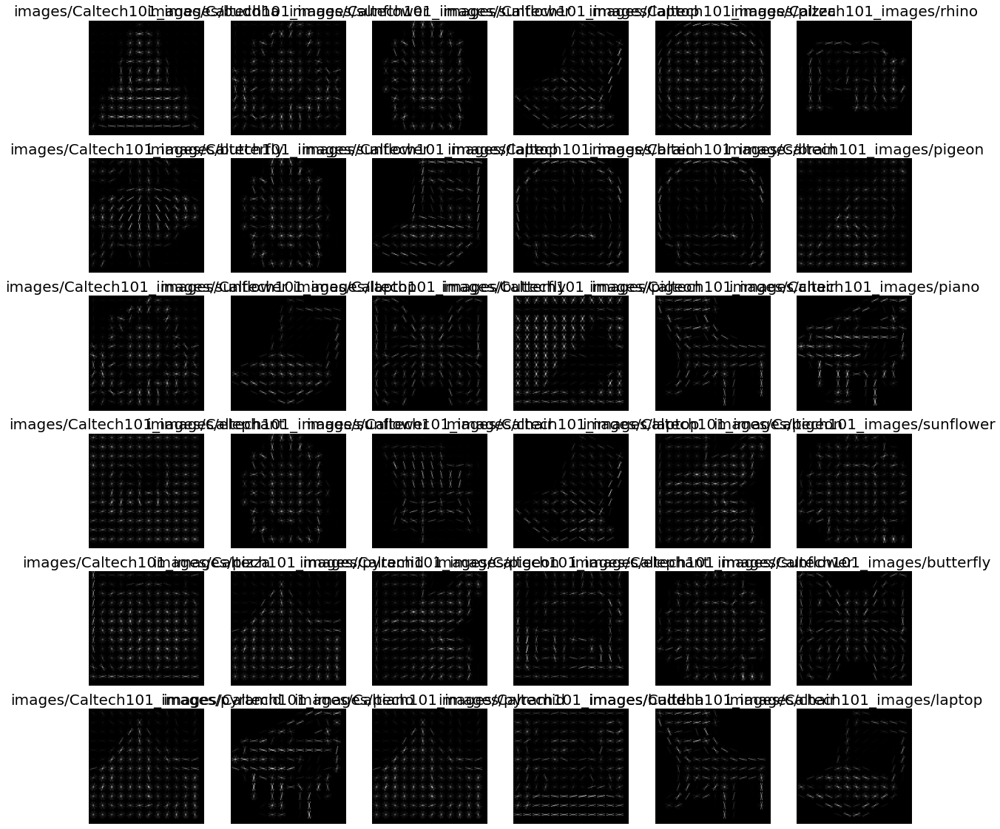

In [ ]:
# Prikaz učitanih fotografija
# Prikaz kreiranih HOG fotografija  

n = 6
indices = np.random.choice(len(images), n*n)
plt.figure(figsize=(20,20))
plt.gray()
i = 1
for index in indices:
    plt.subplot(n,n,i), plt.imshow(images[index]), plt.axis('off'), plt.title(y[index], size=20)
    i += 1
plt.show()
plt.figure(figsize=(20,20))
i = 1
for index in indices:
    plt.subplot(n,n,i), plt.imshow(hog_images[index]), plt.axis('off'), plt.title(y[index], size=20)
    i += 1
plt.show()

In [ ]:
"""
Napravite skup podataka koji će klasifikator koristiti pomoću HOG deskriptora i oznake za svaku fotografiju. 
Podelite skup podataka na dva dela: 90% kao trening i 10% kao testni skup podataka. 
Na kraju, instancirajte LogisticRegession klasu za klasifikaciju više klasa i obučite klasifikator na kreiranom skupu podataka o obuci.
"""

X = np.array(X)
y = np.array(y)
indices = np.arange(len(X))
X_train, X_test, y_train, y_test, id_train, id_test = train_test_split(X, y, indices, test_size=0.1, random_state=1)

#clf = svm.LinearSVC(C=10)
clf = LogisticRegression(C=1000, random_state=0, solver='lbfgs', multi_class='multinomial')
clf.fit(X_train, y_train)

LogisticRegression(C=1000, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
"""
Predvidite oznake fotografija u kreiranom skupu podataka za trening i 
izračunajte tačnost predviđanja na skupu podataka za trening.
"""

y_pred = clf.predict(X_train)
print("Accuracy: " + str(accuracy_score(y_train, y_pred)))
print('\n')
print(classification_report(y_train, y_pred))

Accuracy: 1.0


                                    precision    recall  f1-score   support

    images/Caltech101_images/brain       1.00      1.00      1.00         2
   images/Caltech101_images/buddha       1.00      1.00      1.00         1
images/Caltech101_images/butterfly       1.00      1.00      1.00         2
    images/Caltech101_images/chair       1.00      1.00      1.00         3
 images/Caltech101_images/elephant       1.00      1.00      1.00         3
   images/Caltech101_images/laptop       1.00      1.00      1.00         3
    images/Caltech101_images/piano       1.00      1.00      1.00         2
   images/Caltech101_images/pigeon       1.00      1.00      1.00         3
    images/Caltech101_images/pizza       1.00      1.00      1.00         3
  images/Caltech101_images/pyramid       1.00      1.00      1.00         3
    images/Caltech101_images/rhino       1.00      1.00      1.00         3
images/Caltech101_images/sunflower       1.00      1.00      1.00      

In [ ]:
"""
Predvidite oznake fotografija u kreiranom skupu podataka za testiranje i 
izračunajte tačnost predviđanja na skupu podataka za testiranje.
"""

y_pred = clf.predict(X_test)
print("Accuracy: " + str(accuracy_score(y_test, y_pred)))
print('\n')
print(classification_report(y_test, y_pred))

Accuracy: 0.0


                                    precision    recall  f1-score   support

    images/Caltech101_images/brain       0.00      0.00      0.00       1.0
   images/Caltech101_images/buddha       0.00      0.00      0.00       1.0
images/Caltech101_images/butterfly       0.00      0.00      0.00       1.0
    images/Caltech101_images/pizza       0.00      0.00      0.00       0.0
  images/Caltech101_images/pyramid       0.00      0.00      0.00       0.0
images/Caltech101_images/sunflower       0.00      0.00      0.00       1.0

                          accuracy                           0.00       4.0
                         macro avg       0.00      0.00      0.00       4.0
                      weighted avg       0.00      0.00      0.00       4.0



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


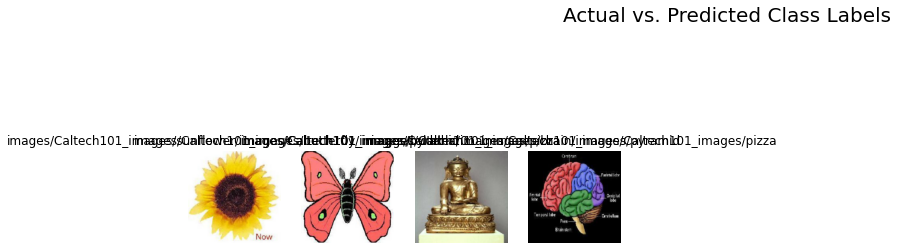

In [ ]:
"""
Iscrtajte sve testne fotografije zajedno sa stvarnim (ground-truth) oznakama 
i oznakama predviđenim klasifikatorom fotografija
"""

plt.figure(figsize=(20,20))
j = 0
for i in id_test:
    plt.subplot(10,10,j+1), plt.imshow(images[i]), plt.axis('off'), plt.title('{}/{}'.format(y_test[j], y_pred[j]))
    j += 1
plt.suptitle('Actual vs. Predicted Class Labels', size=20)
plt.show()

### Gabor Filter banks for Texture Classification // Gabor filter banke za klasifikaciju tekstura

Predstavićemo kako klasifikovati teksture pomoću Gaborovih filtera banaka.

Frekvencija i orijentacija su dva ključna parametra Gaborovog filtera koji otkriva prisustvo datog sadržaja frekvencije na fotografiji u datom smeru oko ROI susedstva. Gaborovo jezgro ima i realni i imaginarni deo, gde se realni deo koristi za filtriranje fotografija. Karakteristike koje će se koristiti za klasifikaciju (tekstura) su srednja vrednost i varijansa (često zasnovana na LSE) filtrirane fotografije. 
Impulsni odziv Gaborovog filtra produkt je sinusne i Gausove funkcije, kao što je prikazano sledećom jednačinom:


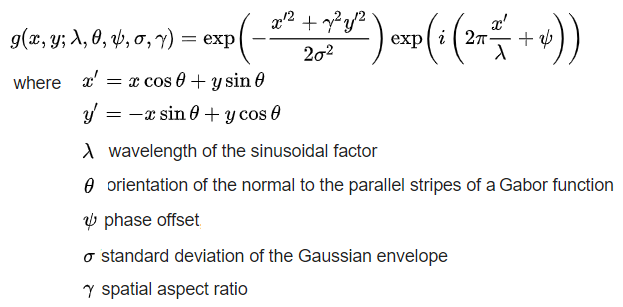

- Funkcija *gabor_kernel()* vraća složeno dvodimenzionalno jezgro Gabor filtera.
Gaborovo jezgro je Gausovo jezgro pomnoženo (modulisano) (složenom) harmoničnom funkcijom, koja se sastoji od stvarnog kosinusa i zamišljenog sinusnog pojma.
Parametar frekvencije funkcije predstavlja prostornu frekvenciju skladnosti (u pikselima).

 Frekvencija je ∞ 1/talasna dužina i takođe je obrnuto proporcionalna σ. Slično tome, širina pojasa je ∞ 1/σ, gde je σ standardna devijacija Gaussovog jezgra.

 Parametar θ predstavlja orijentaciju u radijanima (na primer, θ = 0 podrazumeva da je skladnost orijentisana ka pravcu x).

 Parametar *bandwidth* predstavlja širinu opsega koju Gabor filter snima. Za datu širinu opsega, σx i σy opadaju kada se frekvencija povećava.
(Opcionalni) parametri σx i σy označavaju standardna odstupanja u pravcima x i y. Na primer, kada je θ = π/2, tada jezgro prolazi rotaciju od 90 stepeni i σx kontroliše vertikalni smer.

- Funkcija *match()* pronalazi najbolje moguće podudaranje za probnu fotografiju računanjem udaljenosti probne fotografije koju Gabor karakteriše sa svakom karakteristikom Gabor referentne fotografije i vraća referentnu fotografiju koja je najbliža.

In [ ]:
#http://slazebni.cs.illinois.edu/research/uiuc_texture_dataset.zip
from glob import glob
for class_name in glob('images/UIUC_textures/*'):
    print(class_name)

images/UIUC_textures/woods
images/UIUC_textures/stones
images/UIUC_textures/checks
images/UIUC_textures/bricks


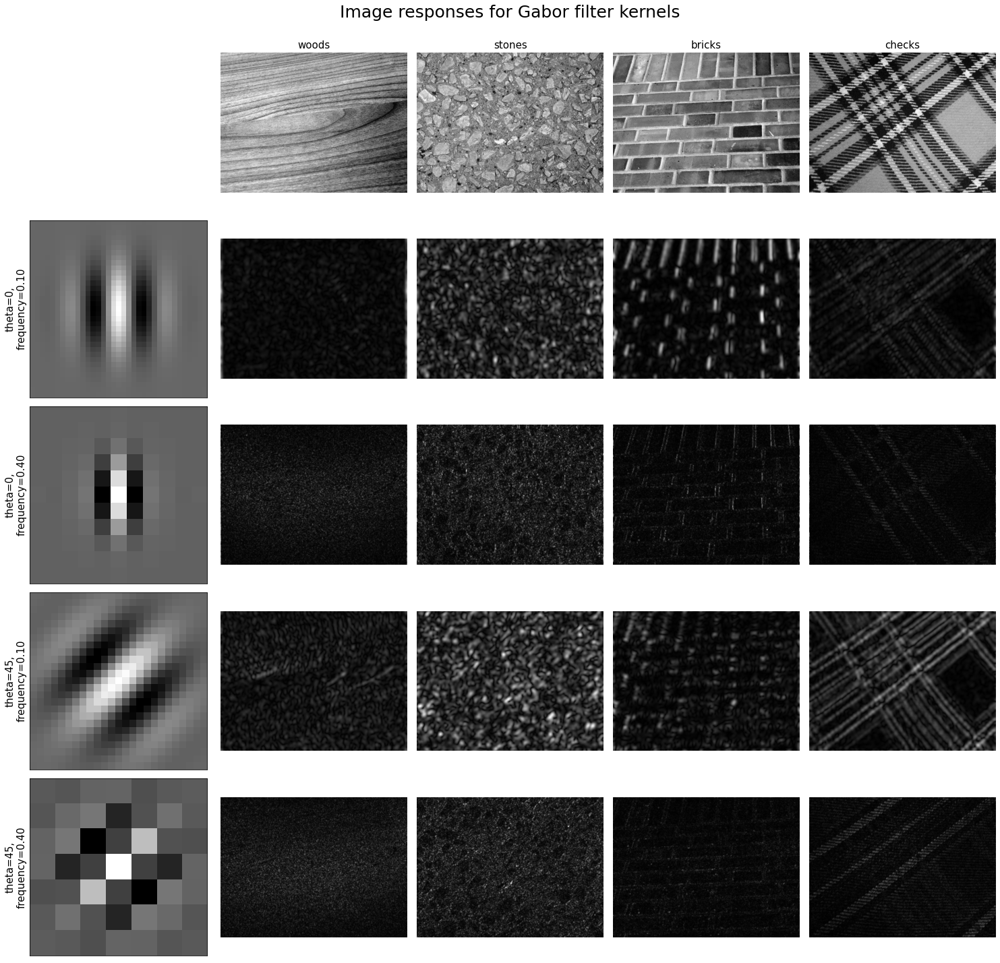

In [ ]:
#https://gogul.dev/software/texture-recognition
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi

# Pripremite kernele Gabor filtera banke
kernels = []
for theta in range(4):
    theta = theta / 4. * np.pi
    for sigma in (1, 3):
        for frequency in (0.05, 0.25):
            kernel = np.real(gabor_kernel(frequency, theta=theta, sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

# Funkcija za konvertovanje ulazne fotografije sa Gaborovim jezgrom (sa stvarnim i imaginarnim delovima)
def power(image, kernel):
    # Normalizujte fotografije za bolje poređenje.
    image = (image - image.mean()) / image.std()
    return np.sqrt(ndi.convolve(image, np.real(kernel), mode='wrap')**2 + ndi.convolve(image, np.imag(kernel), mode='wrap')**2)

"""
Za svaku od četiri klase tekstura koristićemo dve fotografije - jednu kao referencu, a drugu kao probnu fotografiju. 
Učitajmo prvo referentne fotografije za svaku od četiri klase koje smo izabrali.
"""
image_names = ['images/UIUC_textures/woods/T04_01.jpg',
               'images/UIUC_textures/stones/T12_01.jpg',
               'images/UIUC_textures/bricks/T15_01.jpg',
               'images/UIUC_textures/checks/T25_01.jpg',
              ]
labels = ['woods', 'stones', 'bricks', 'checks']

images = []
for image_name in image_names:
    images.append(rgb2gray(imread(image_name)))

# Napravite 4 kernela banke filtera sa različitim vrednostima parametara (theta i frequency).
results = []
kernel_params = []
for theta in (0, 1):
    theta = theta / 4. * np.pi
    for frequency in (0.1, 0.4):
        kernel = gabor_kernel(frequency, theta=theta)
        params = 'theta=%d,\nfrequency=%.2f' % (theta * 180 / np.pi, frequency)
        kernel_params.append(params)
        # Save kernel and the power image for each image
        results.append((kernel, [power(img, kernel) for img in images]))

fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))
plt.gray()
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
fig.suptitle('Image responses for Gabor filter kernels', fontsize=25)

axes[0][0].axis('off')

# Prikaz originalih fotografija
for label, img, ax in zip(labels, images, axes[0][1:]):
    ax.imshow(img)
    ax.set_title(label, fontsize=15)
    ax.axis('off')

for label, (kernel, powers), ax_row in zip(kernel_params, results, axes[1:]):
    # Prikaz Gabor kernela
    ax = ax_row[0]
    ax.imshow(np.real(kernel))
    ax.set_ylabel(label, fontsize=15)
    ax.set_xticks([])
    ax.set_yticks([])

    # Prikaz Gaborove odgovore sa kontrastom normalizovanim za svaki filter
    vmin = np.min(powers)
    vmax = np.max(powers)
    for patch, ax in zip(powers, ax_row[1:]):
        ax.imshow(patch, vmin=vmin, vmax=vmax)
        ax.axis('off')

plt.show()

Images matched against references using Gabor filter banks:
original: woods, match result: woods 
original: stones, match result: stones 
original: bricks, match result: bricks 
original: checks, match result: checks 


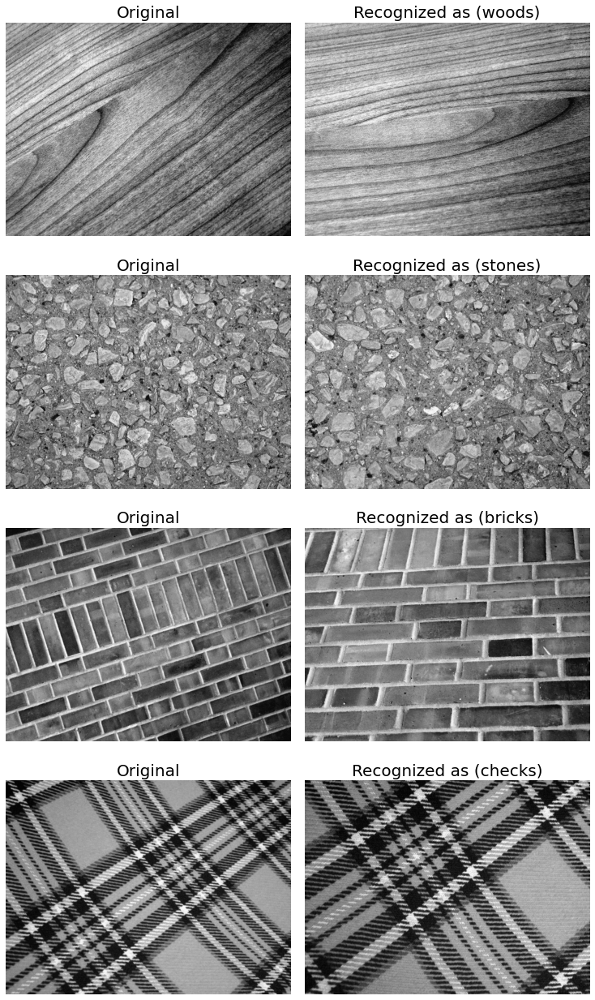

In [ ]:
# Funkcija za izdvajanje karakteristika fotografije koja odgovara kernelu banke Gabor filtera
def compute_feats(image, kernels):
    feats = np.zeros((len(kernels), 2), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(image, kernel, mode='wrap')
        feats[k, 0] = filtered.mean()
        feats[k, 1] = filtered.var()
    return feats

"""
Funkcija koja izvršava zadatak klasifikacije - tj. 
prihvata izvađene karakteristike nove fotografije zajedno sa 
karakteristikama referentnih fotografija kao parametre, 
zatim podudara novu fotografiju sa referentnim fotografijama 
i vraća indeks referentne fotografije (ovde ćemo koristiti euklidsku udaljenost).
"""
def match(feats, ref_feats):
    min_error = np.inf
    min_i = None
    for i in range(ref_feats.shape[0]):
        error = np.sum((feats - ref_feats[i, :])**2)
        if error < min_error:
            min_error = error
            min_i = i
    return min_i

"""
Izdvojite karakteristike referentne fotografije i nove testne fotografije.
Klasifikujte testne fotografije - tj. podudarite svaku novu (testnu) fotografiju sa najbližom referentnom fotografijom
i označite testnu fotografiju sa klasom referentne fotografije.
"""
ref_feats = np.zeros((4, len(kernels), 2), dtype=np.double)
for i in range(4):
    ref_feats[i, :, :] = compute_feats(images[i], kernels)

print('Images matched against references using Gabor filter banks:')

new_image_names = ['images/UIUC_textures/woods/T04_02.jpg',
               'images/UIUC_textures/stones/T12_02.jpg',
               'images/UIUC_textures/bricks/T15_02.jpg',
               'images/UIUC_textures/checks/T25_02.jpg',
              ]

plt.figure(figsize=(10,18))
plt.subplots_adjust(0,0,1,0.95,0.05,0.05)
for i in range(4):
    image = rgb2gray(imread(new_image_names[i]))
    feats = compute_feats(image, kernels)
    mindex = match(feats, ref_feats)
    print('original: {}, match result: {} '.format(labels[i], labels[mindex]))
    plt.subplot(4,2,2*i+1), plt.imshow(image), plt.axis('off'), plt.title('Original', size=20)
    plt.subplot(4,2,2*i+2), plt.imshow(images[mindex]), plt.axis('off'), plt.title('Recognized as ({})'.format(labels[mindex]), size=20)
plt.show()
# Možemo videti da se testna fotografija podudara kao fotografija najbliža referentnoj fotografiji.

### Image Classification with VGG-19 / Inception V3 / MobileNet / ResNet101 (with deep learning, pytorch) // Klasifikacija fotografije pomoću VGG-19 / Inception V3 / MobileNet / ResNet101 

Prikazaćemo kako da koristite nekoliko prethodno poznatih modela za duboko učenje torchvision-a za nekoliko poznatih modela. 

ImageNet je baza podataka fotografija koja je organizovana prema WordNet hijerarhiji. Stotine/hiljade fotografija pripadaju svakom čvoru u hijerarhiji.

Sledeći grafik prikazuje top-1 tačnost postignutu sa nekoliko popularnih dubokih neuronskih mreža koje su učestvovale u ImageNet Challenge-u, počev od AlexNet (Krizhevsky et al., 2012) krajnje levo, pa sve do najbolje izvedene Inception-v4 (Szegedy et al., 2016) krajnje desno:


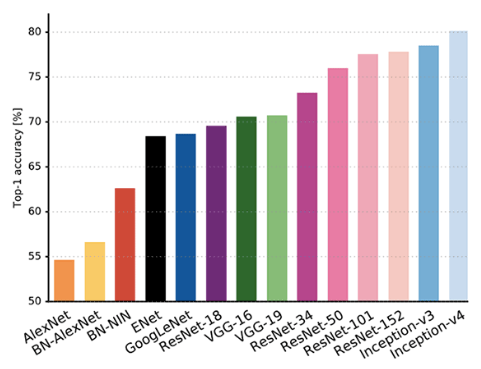

Top-1 tačnost je definisana kao prosečan broj puta kada je tačna oznaka za fotografiju bila najviša klasa verovatnoće koju je CNN predvideo za tu fotografiju. Na drugom kraju skale, top-1 greška prikazuje grešku koja se javlja kada se klasa predviđena modelom (oznaka klase kojoj model pripisuje najveće poverenje) razlikuje od stvarne klase (*ground-truth*).

- Prvo je ulazna fotografija učitana i unapred obrađena (tako da ima oblik i srednju vrednost ili standardnu devijaciju koju očekuje odgovarajući model) kako bi se osiguralo da model daje značajne rezultate.

- Ulazna fotografija transformisana je pomoću *torchvision.transforms*, a funkcija *compose()* koristi se za grupisanje niza transformacija fotografije (promenljiva transformacija kreira se kao kombinacija svih transformacija koje se na ulaznu fotografiju treba primeniti kao korak predobrade; npr. promena veličine, centriranje i normalizacija).

- Primerak duboke neuronske mreže stvoren je učitavanjem težina modela iz prethodno obučenog modela (na ImageNet-u). Npr. kod models.vgg19 (*pretrained = True*), ponderi modela se preuzimaju prvi put, a zatim keširaju (model *PyTorch* obično ima proširenje .pt/.pth).

- Model je postavljen na svoj *eval* režim primenom metode *resnet101.eval()* (npr. za model ResNet101).

- Za pokretanje zaključka (odnosno za prolazak unapred kroz prethodno obučeni model sa ulaznom fotografijom) pozvana je metoda *resnet101()* (npr. za model ResNet101) koja je dala vektor od 1000 elemenata (klase), gde je svaka vrednost elementa predstavlja verovatnoću da ulazna fotografija pripada određenoj klasi (prema prethodno obučenom modelu).

- Na kraju, morali smo da saznamo indeks klase koji odgovara maksimalnom rezultatu (koristeći funkciju *np.argmax()*) iz izlaznog vektora. Ovaj indeks klase koristi se za izdvajanje imena predviđene klase sa liste klasa. Verovatnoću koja odgovara predviđenoj klasi možemo dobiti iz vektora izlazne verovatnoće (npr. ResNet101 je pravilno predvideo fotografiju geparda sa pouzdanošću od 99,57%).

- Performanse prethodno obučenih modela mogu se upoređivati pomoću sledećih kriterijuma za procenu: top-1/top-5 greška, vreme zaključivanja na CPU/GPU, veličina modela. Dobar model mora imati male vrednosti top-1/top-5 greške, vreme zaključivanja i veličinu modela.


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth



cheetah 99.89791870117188


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth



cheetah 91.21221923828125


Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth



cheetah 99.99945068359375


Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth



cheetah 99.57327270507812


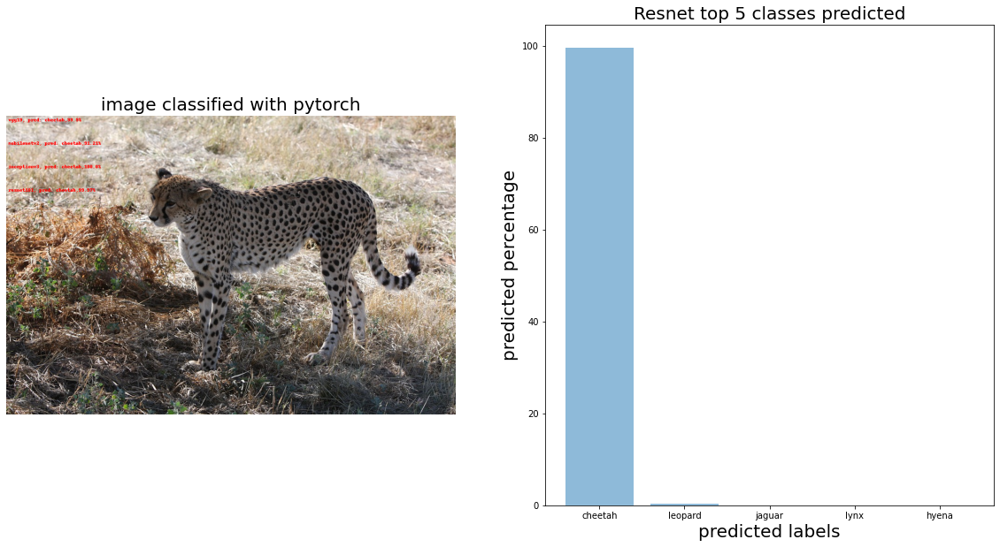

goose 98.00643157958984
American_egret 47.18150329589844
goose 70.42154693603516
goose 95.96503448486328


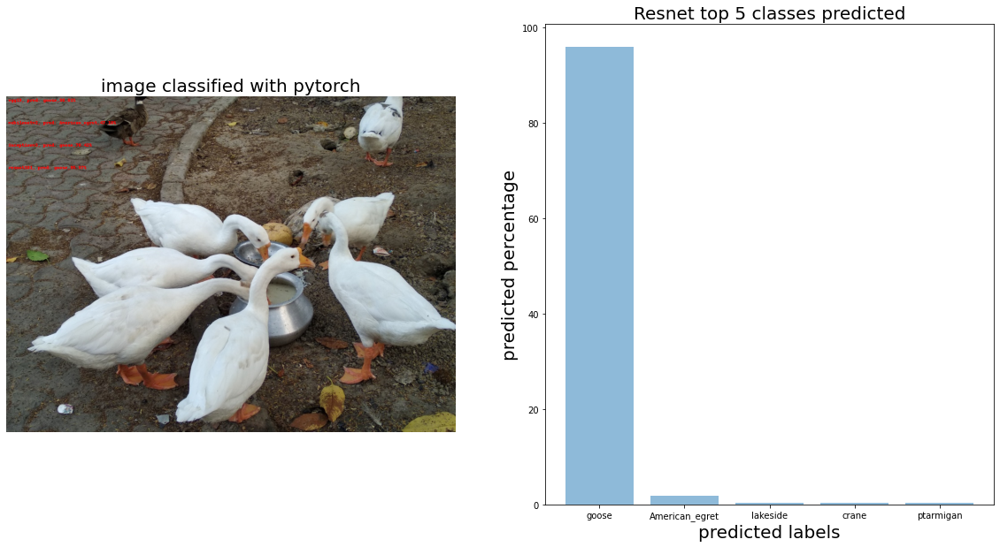

In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import matplotlib.pylab as plt

"""
Funkcija prihvata ulaznu fotografiju i prethodno obučeni model (na ImageNet-u), 
zajedno sa imenom modela i oznakama klase ImageNet, 
vraćajući klasifikator koji odgovara najvećoj predviđenoj verovatnoći.
"""
def classify(img, model_index, model_name, model_pred, labels):
    #print(model_name, model_pred.shape)
    _, index = torch.max(model_pred, 1)
    model_pred, indices = torch.sort(model_pred, dim=1, descending=True)
    percentage = torch.nn.functional.softmax(model_pred, dim=1)[0] * 100
    print(labels[index[0]], percentage[0].item())
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.text((5, 5+model_index*50),'{}, pred: {},{}%'.format(model_name, labels[index[0]], round(percentage[0].item(),2)),(255,0,0),font=font)
    return indices, percentage
    
# Pročitajte klase ImageNet (postoji 1000 klasa) i navedite dostupne modele u torchvisionu.
with open('models/imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()]
# print(dir(models))

"""
Sastavite transformacije koje se primenjuju na ulaznu fotografiju kao korak predobrade 
(npr. promenite veličinu, centrirajte i odsecite, z-rezultat normalizujte transformacije, a zatim pretvorite fotografiju u tenzor).
"""
transform = transforms.Compose([            
 transforms.Resize(256),                    
 transforms.CenterCrop(224),                
 transforms.ToTensor(),                     
 transforms.Normalize(                      
 mean=[0.485, 0.456, 0.406],                
 std=[0.229, 0.224, 0.225]                  
 )])

"""
Pročitajte ulazne fotografije koje treba klasifikovati pomoću prethodno obučenih dubokih neuronskih mreža. 
Primenite na fotografije prethodno definisanu transformaciju pretprocesiranja.
"""
for imgfile in ["images/cheetah.png", "images/swan.png"]:
    
    img = Image.open(imgfile).convert('RGB')
    img_t = transform(img)
    batch_t = torch.unsqueeze(img_t, 0)

    """
    Instancirajte nekoliko prethodno obučenih (sa ImageNet težinama) poznatih modela dubokog učenja 
    (npr. VGG16, MobileNetV2, InceptionV3 i ResNet101). 
    Pokrenite prosleđivanje ulazne fotografije i pribavite predviđanje 
    (zajedno sa vrednostima verovatnoće koje odgovaraju svakoj od 1000 klasa u ImageNet-u) za verovatnu klasu fotografije.
    """
    vgg19 = models.vgg19(pretrained=True)
    vgg19.eval()
    pred = vgg19(batch_t)
    classify(img, 0, 'vgg19', pred, labels)

    mobilenetv2 = models.mobilenet_v2(pretrained=True)
    mobilenetv2.eval()
    pred = mobilenetv2(batch_t)
    classify(img, 1, 'mobilenetv2', pred, labels)

    inceptionv3 = models.inception_v3(pretrained=True)
    inceptionv3.eval()
    pred = inceptionv3(batch_t)
    classify(img, 2, 'inceptionv3', pred, labels)

    resnet101 = models.resnet101(pretrained=True)
    resnet101.eval()
    pred = resnet101(batch_t)
    indices, percentages = classify(img, 3, 'resnet101', pred, labels)
    
    plt.figure(figsize=(20,10))
    plt.subplot(121), plt.imshow(img), plt.axis('off'), plt.title('image classified with pytorch', size=20)
    plt.subplot(122), plt.bar(range(5), percentages.detach().numpy()[:5], align='center', alpha=0.5)
    #print(indices[0].detach().numpy()[:5])
    plt.xticks(range(5),  np.array(labels)[indices.detach().numpy().astype(int)[0][:5]])
    plt.xlabel('predicted labels', size=20), plt.ylabel('predicted percentage', size=20)
    plt.title('Resnet top 5 classes predicted', size=20)
    plt.show()

### Image Classification with Fine Tuning + Transfer learning // Klasifikacija fotografija uz fino podešavanje + *transfer learning* 

Generička definicija "transfernog učenja" je da je to tehnika dubokog učenja koja ponovo koristi znanje stečeno rešavanjem jednog problema primenom na slični, ali drugačiji problem. 

Recimo da imamo tri vrste cveća - ružu, suncokret i lalu. Za klasifikaciju cvetnih fotografija možemo koristiti standardne prethodno obučene modele, kao što su VGG16/19, ResNet50 ili InceptionV3 modeli (prethodno obučeni na ImageNet-u sa 1000 izlaznih klasa, navedenih na https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a ), ali naš model ih neće pravilno klasifikovati, jer ove cvetne kategorije nisu postojale u *ground-truth* klasama na kojima je model obučen. Drugim rečima, to su klase kojih model nije svestan. 

Sledeća fotografija pokazuje kako su fotografije cvetova pogrešno klasifikovane pomoću prethodno obučenog modela VGG16 (za klasifikaciju koristite prethodno obučene modele iz keras):

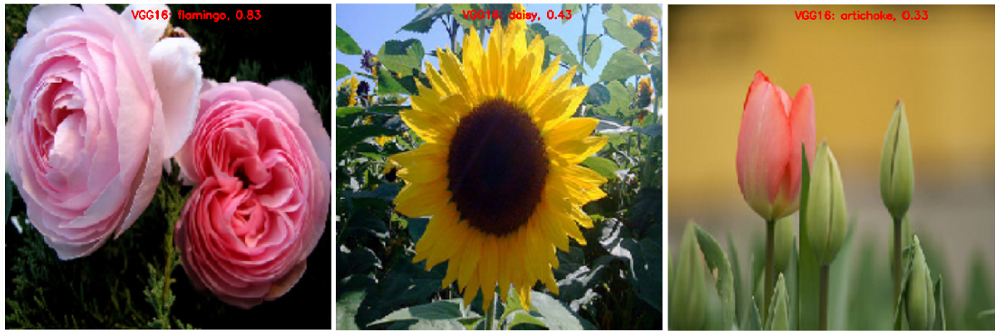

Kada se duboka neuronska mreža trenira od nule, potreban je ogroman skup podataka (zajedno sa moćnim računarskim resursima) za obuku mreže (budući da neuronska mreža ima milione parametara i težimo da kroz trening dobijemo optimalan skup parametara). Stvara se problem kada imamo male skupove podataka koji nisu dovoljni za obuku duboke mreže. Ovde *transfer learning* dolazi u pomoć.

Budući da su standardni modeli, poput VGG-16/19, prilično veliki i obučeni su na mnogim fotografijama, sposobni su da nauče mnogo različitih karakteristika za različite klase. Konvolucione slojeve možemo jednostavno ponovo koristiti kao ekstraktore karakteristika koji uči karakteristike fotografije na niskom i visokom nivou i obučiti samo potpuno povezane (*fully connected* - FC) težine sloja (parametre) sloja. To je ono što predstavlja *transfer learning*. Ali ako za učenje klasifikujete mali skup podataka koji se sastoji od fotografija ruža, suncokreta i lala, ako koristite *transfer learning* sa samo FC slojevima koji se mogu obučiti (i fiksiraju konvolucione slojeve, pomoću duboko urađene neuronske mreže ImageNet), da biste klasifikovali mali skup podataka, tačnost predviđanja na skupu testova sa učenjem prenosa nije dobra. 

Fino podešavanje duboke neuronske mreže ponovo pokušava da modifikuje parametre (delimičnim treningom samo nekoliko izabranih slojeva) unapred obučene mreže kako bi se prilagodilo novom zadatku (npr. klasifikovanje cvetova sa novim oznakama klase). Budući da početni slojevi duboke neuronske mreže uče vrlo opšte karakteristike (npr. ivice na fotografiji), a dublji slojevi uče konkretnije obrasce (s obzirom na zadatak za koji je obučena), uz fino podešavanje, početni slojevi se čuvaju netaknuto (zamrzavanjem) i nekoliko dubljih slojeva se prekvalifikuje za novi zadatak. Količina podataka potrebnih za ovu delimičnu obuku nije velika, jer celokupna mreža nije obučena i ne treba da treniramo od nule (stoga je potrebno ažurirati manji broj parametara, sa manje vremena potrebnog za prekvalifikaciju).


- Klasa *ImageDataGenerator* koristi se za učitavanje fotografija i datoteke.

- Funkcija *flow_from_directory()* koristi se za generisanje serija fotografija i oznaka.

- Model je konfigurisan funkcijom *model.compile()* koristeći kategorički ukrštanje entropije (jer imamo tri klase) i *RMSProp* optimizator sa stopom učenja od 10-5.

- Za obuku modela korišćena je metoda *model.fit_generator()*.

- Fino podešavanje sprovedeno sa *Keras*-om delimično je obučilo model VGG16 - tj. naučilo je samo pondere FC slojeva i poslednja dva uvozna sloja iz particije za obuku.

- Funkcija *model.predict_generator()* je korišćena za predviđanje oznaka test fotografija.

- U *Keras*-u, svaki sloj mreže ima parametar koji se može obučiti. Da biste zamrzli (odnosno zaustavili trening) bilo koji sloj, parametar koji odgovara tom sloju mora biti postavljen na *False*.

- Prešli smo preko svakog sloja da bismo izabrali slojeve za ponovno usavršavanje.


In [ ]:
from keras.applications import VGG16
from keras.preprocessing.image import ImageDataGenerator
from keras import models, layers, optimizers
from keras.layers.normalization import BatchNormalization
from keras.preprocessing.image import load_img
from keras import models
from keras import layers
from keras import optimizers
import pydot_ng as pydot
from keras.utils import plot_model
import matplotlib.pylab as plt
import numpy as np

"""
Definišite direktorijume treninga i testa zajedno sa veličinom 
na koju će se promeniti veličina ulaznih fotografija pre treninga.
"""
train_dir = 'images/flower_photos/train'
test_dir = 'images/flower_photos/test'
image_size = 224

# Učitavanje VGG modela
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Zamrznite sve slojeve konvolucije, osim poslednja dva
for layer in vgg_conv.layers[:-2]:
    layer.trainable = False

# Proverite status obučenosti pojedinih slojeva
for layer in vgg_conv.layers:
    print(layer, layer.trainable)

# Kreirajte model
model = models.Sequential()

# Dodajte vgg konvolucionalni osnovni model
model.add(vgg_conv)

# Dodajte nove FC slojeve
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(3, activation='softmax'))

# Prikažite rezime modela. Proverite broj parametara koji se mogu obučiti
model.summary()

"""
Učitajte fotografije za trening i testirajte ulazne fotografije.
Postavite validation_split na 0,2 - tj. 20% fotografija sa treninga će se zadržati (kao skup podataka za validaciju) 
da bi se procenio model klasifikatora koji je obučen na preostalih 80% fotografija sa treninga.
"""
train_datagen = ImageDataGenerator(rescale=1./255,
    validation_split=0.2) # set validation split
test_datagen = ImageDataGenerator(rescale=1./255)

# Definišite veličinu serije za trening (broj fotografija koje treba proslediti u jednom prolazu napred/nazad))
train_batchsize = 12

# Definišite generatore treninga, validacije i testiranja podataka za čitanje/generisanje serija fotografija i oznaka iz odgovarajućih direktorijuma. 
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical',
        subset='training')

validation_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical',
        classes = ['roses', 'sunflowers', 'tulips'],
        subset='validation') 

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(image_size, image_size),
        batch_size=1,
        class_mode='categorical',
        classes = ['roses', 'sunflowers', 'tulips'],
        shuffle=False)

# Konfigurišite prethodno kreirani model za obuku
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['acc'])

# Obuka modela
history = model.fit_generator(
      train_generator,
      steps_per_epoch=(train_generator.samples/train_generator.batch_size),
      epochs=10,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Sačuvajte model
model.save('all_freezed.h5')
plot_model(model, to_file='images/model.png')

# Prikažite krive tačnosti i gubitaka
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

58892288/58889256 [==============================] - 0s 0us/step
<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f26e56d2690> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f26b1219f90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f26b0b053d0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f26a00e9c50> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f26a00f5190> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f26a00facd0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f26a0103f10> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f26a010ee90> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f26a010e090> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f26a0111310> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f26a0118890> Fals

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
10/10 [==============================] - 38s 345ms/step - loss: 1.4734 - acc: 0.3374 - val_loss: 0.9770 - val_acc: 0.4333
Epoch 2/10
10/10 [==============================] - 1s 97ms/step - loss: 0.9043 - acc: 0.5138 - val_loss: 0.8910 - val_acc: 0.4667
Epoch 3/10
10/10 [==============================] - 1s 98ms/step - loss: 0.6587 - acc: 0.7825 - val_loss: 0.7605 - val_acc: 0.7000
Epoch 4/10
10/10 [==============================] - 1s 98ms/step - loss: 0.5373 - acc: 0.8372 - val_loss: 0.6918 - val_acc: 0.8667
Epoch 5/10
10/10 [==============================] - 1s 98ms/step - loss: 0.4513 - acc: 0.8101 - val_loss: 0.6182 - val_acc: 0.8667
Epoch 6/10
10/10 [==============================] - 1s 98ms/step - loss: 0.2402 - acc: 0.9769 - val_loss: 0.5745 - val_acc: 0.9000
Epoch 7/10
10/10 [==============================] - 1s 97ms/step - loss: 0.2289 - acc: 0.9857 - val_loss: 0.5230 - val_acc: 0.9000
Epoch 8/10
10/10 [==============================] - 1s 98ms/step - loss: 0.2573 -

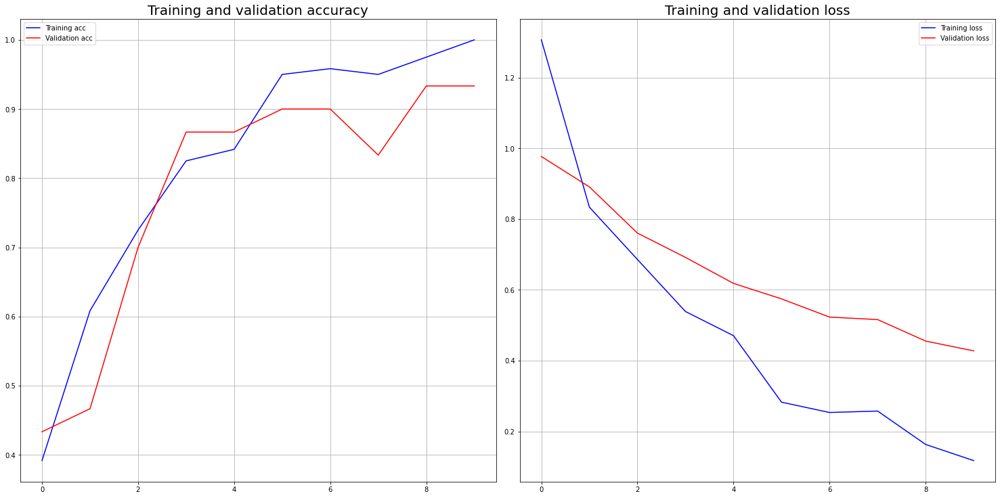

In [ ]:
# Prikaz tačnosti treninga i validacije
# Prikaz gubitka treninga i validacije

plt.figure(figsize=(20,10))
plt.subplots_adjust(left=0, right=1, bottom=0, top=0.95, wspace=0.05, hspace=0)
plt.subplot(121)
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy', size=20)
plt.legend(prop={'size': 10})
plt.grid()
plt.subplot(122)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss', size=20)
plt.legend(prop={'size': 10})
plt.grid()
plt.show()

In [ ]:
# https://github.com/keras-team/keras/issues/3477

test_generator.reset()

# Preuzmite nazive datoteka iz generatora
fnames = test_generator.filenames

# Preuzmite ground-truth iz generatora
ground_truth = test_generator.classes

# Preuzmite oznaku za mapiranje klasa iz generatora
label2index = test_generator.class_indices

# Dobijanje mapiranja od indeksa klase do oznake klase
index2label = dict((v,k) for k,v in label2index.items())

# Dobijanje predviđanja iz modela pomoću generatora
predictions = model.predict_generator(test_generator, steps=len(fnames))
predicted_classes = np.argmax(predictions,axis=-1)
predicted_classes = np.array([index2label[k] for k in predicted_classes])
ground_truth = np.array([index2label[k] for k in ground_truth])

# Izračunati broj grešaka koje je napravio model
errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),test_generator.samples))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


No of errors = 4/9


### Traffic Signal Classification with deep learning // Klasifikacija saobraćajnih znakova pomoću *deep learning*-a 

Pokazaćemo kako da istrenirate prilagođenu neuronsku mrežu pomoću PyTorch-a i da koristite predviđanja modela za klasifikaciju saobraćajnih znakova. 

Kao ulazne fotografije za obuku/testiranje koristićemo skup podataka Nemačkog referentnog znaka za prepoznavanje saobraćajnih znakova (GTSRB). Fotografije su označene sa 43 različita saobraćajna znaka. Skup podataka sadrži 39.209 trening i 12.630 probnih fotografija.

- Uzorkovanje se koristi za rešavanje disbalansa klase.

- *WeightedRandomSampler()* koristi se za uzorkovanje fotografija koje odgovaraju jednakoj učestalosti za sve 43 klase (2000 fotografija po klasi, što takođe povećava ukupan broj ulaznih fotografija), a zatim su prosleđene u *PyTorch loader* podataka.

- Za podelu fotografija na kontekstualne regione korišćen je algoritam adaptivnog izjednačavanja histograma ograničenog kontrasta (CLAHE), praćen primenom izjednačavanja histograma na svaku regiju. Izgleda da su skrivene karakteristike fotografije vidljivije sa CLAHE nego sa izjednačavanjem histograma, jer je raspodela upotrebljenih sivih vrednosti izjednačena.

- Ulazne fotografije u boji pretvorene su u *grayscale* fotografije tako što su prvo transformisane iz RGB u prostor boja YCbCr, a zatim izdvojile kanal intenziteta Y iz prostora boja YCbCr.

- Apstraktna klasa *torch.utils.data.Dataset* predstavlja skup podataka koji se može ponoviti pomoću *torch.utils.data.DataLoader*.

- Da bi se sprečio *overfitting*, koriste se tehnike osipanja i normalizacije serije.

- Biblioteka *livelossplot* koristi se za crtanje gubitka treninga uživo.

- Funkcija *torch.no_grad()* zaustavlja izračunavanje gradijenata u fazi validacije (jer samo želimo da procenimo model koji smo do sada naučili na ispruženom skupu podataka za validaciju i ne želimo da ažuriramo težine u ovoj fazi).

In [ ]:
!wget https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Training_Images.zip

--2021-04-27 08:19:22--  https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Training_Images.zip
Resolving sid.erda.dk (sid.erda.dk)... 130.225.104.13
Connecting to sid.erda.dk (sid.erda.dk)|130.225.104.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 276294756 (263M) [application/zip]
Saving to: ‘GTSRB_Final_Training_Images.zip’

GTSRB_Final_Trainin 100%[===================>] 263.50M  19.0MB/s    in 15s     

2021-04-27 08:19:38 (17.6 MB/s) - ‘GTSRB_Final_Training_Images.zip’ saved [276294756/276294756]



In [ ]:
!unzip GTSRB_Final_Training_Images.zip

Streaming output truncated to the last 5000 lines.
  inflating: GTSRB/Final_Training/Images/00035/00000_00019.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00020.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00021.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00022.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00023.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00024.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00025.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00026.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00027.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00028.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00000_00029.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00001_00000.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00001_00001.ppm  
  inflating: GTSRB/Final_Training/Images/00035/00001_00002.ppm  
  inflating: GTSRB/Final_Training/Image

In [ ]:
#!mkdir traffic_signs
#https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/published-archive.html
import os, glob
from shutil import copy
import pandas as pd

image_dir = 'GTSRB/Final_Training/Images/'
dest_dir = 'images/traffic_signs'
df = pd.DataFrame()
for d in sorted(os.listdir(image_dir)):
    #print(d)
    images = sorted(glob.glob(os.path.join(image_dir, d, '*.ppm')))
    for img in images:
        copy(img, dest_dir)
    for csv in sorted(glob.glob(os.path.join(image_dir, d, '*.csv'))):
        df1 = pd.read_csv(csv, sep=';')
        df = df.append(df1)
        #print(df.head())
        #print(d, len(images), df1.shape)
print(df)
df.to_csv(os.path.join(dest_dir, 'labels.csv'))

            Filename  Width  Height  Roi.X1  Roi.Y1  Roi.X2  Roi.Y2  ClassId
0    00000_00000.ppm     29      30       5       6      24      25        0
1    00000_00001.ppm     30      30       5       5      25      25        0
2    00000_00002.ppm     30      30       5       5      25      25        0
3    00000_00003.ppm     31      31       5       5      26      26        0
4    00000_00004.ppm     30      32       5       6      25      26        0
..               ...    ...     ...     ...     ...     ...     ...      ...
235  00007_00025.ppm     52      56       5       6      47      51       42
236  00007_00026.ppm     56      58       5       5      51      53       42
237  00007_00027.ppm     58      62       5       6      53      57       42
238  00007_00028.ppm     63      69       5       7      58      63       42
239  00007_00029.ppm     68      69       7       6      62      63       42

[39209 rows x 8 columns]


In [ ]:
# Učitajte .csv datoteku imena znakova i kreirajte mapu između ID-ova klase saobraćajnih znakova i imena

import pandas as  pd
signal_names =  pd.read_csv('images/signal_names.csv')
signal_names.head()

,ClassId,SignName
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)


(34799, 32, 32, 3) (4410, 32, 32, 3) (12630, 32, 32, 3) 43


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


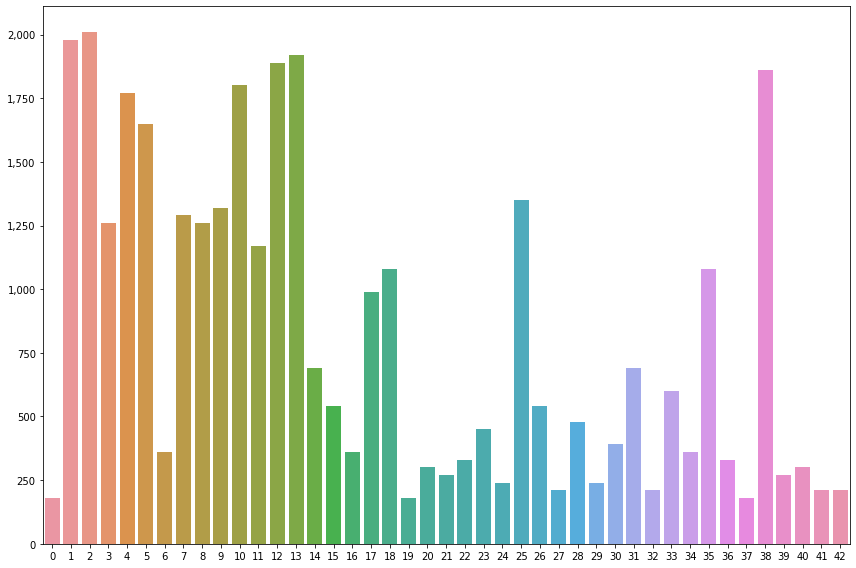

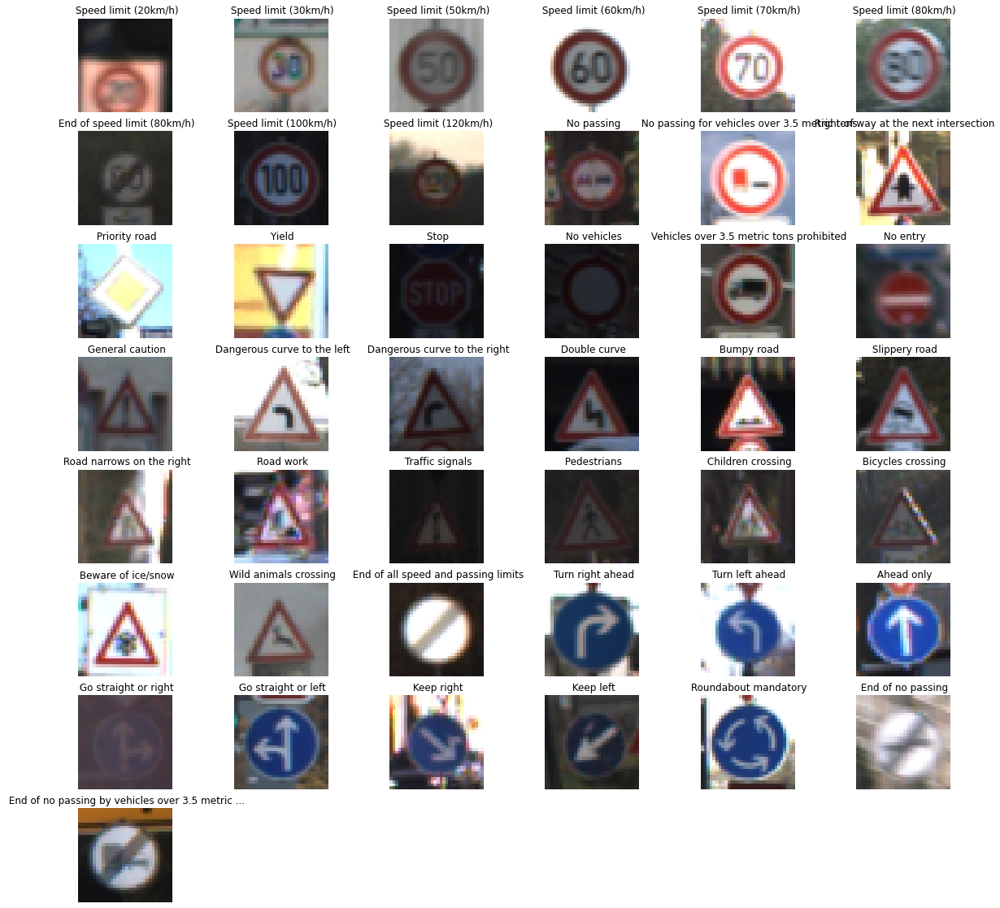

In [ ]:
%matplotlib inline
import pickle
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns

# Učitajte datoteke koje odgovaraju skupovima podataka o treningu, validaciji i testiranju
training_file = "images/traffic_signs/train.p"
validation_file = "images/traffic_signs/valid.p"
testing_file = "images/traffic_signs/test.p"

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(validation_file, mode='rb') as f:
    valid = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)

# Izdvojite karakteristike (fotografija) i oznake (saobraćajni znakovi) iz skupa treninga, validacije i testiranja
X_train, y_train = train['features'], train['labels']
X_valid, y_valid = valid['features'], valid['labels']
X_test, y_test = test['features'], test['labels']
n_signs = len(np.unique(y_train))
print(X_train.shape, X_valid.shape, X_test.shape, n_signs)

# Prikaz ID klasa saobraćajnih znakova prema njihovim frekvencijama
plt.figure(figsize=(12,8))
# plot barh chart with index as x values
ax = sns.barplot(list(range(n_signs)), np.bincount(y_train))
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
plt.tight_layout()
plt.show()

# Prikaz trening fotografija zajedno sa njihovim oznakama
plt.figure(figsize=(20, 20))
for c in range(n_signs):
    i = np.random.choice(np.where(y_train == c)[0])
    plt.subplot(8, 6, c+1)
    plt.axis('off')
    plt.title(signal_names.loc[signal_names['ClassId'] == c].SignName.to_string(index=False))
    plt.imshow(X_train[i])

In [ ]:
!pip install livelossplot

In [ ]:
import cv2 
import torch
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import torch.utils.data.sampler as sampler
from torch import nn, optim
from livelossplot import PlotLosses
import torch.nn.functional as F
import os

# Implementirajte IDSIA MCDNN model definisanjem klase TrafficNet (nasleđivanje od nn.Module).
class TraffficNet(nn.Module):
    # Definicija neuronske mrežu (sa konvolucijom, udruživanjem i potpuno povezanim slojevima)
    def __init__(self, gray=False):
        super(TraffficNet, self).__init__()
        input_chan = 1 if gray else 3
        self.conv1 = nn.Conv2d(input_chan, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 43)

    # Primena prosleđivanja u neuronskoj mreži
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
"""
Ulazne fotografije imaju varijacije visokog kontrasta i koriste normalizaciju kontrasta sa CLAHE transformacijom 
(tj. primenjuju adaptivno izjednačavanje histograma na fotografije koristeći funkciju opencv-python)
"""
class ClaheTranform:
    def __init__(self, clipLimit=2.5, tileGridSize=(4, 4)):
        self.clipLimit = clipLimit
        self.tileGridSize = tileGridSize

    def __call__(self, im):
        img_y = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)[:,:,0]
        clahe = cv2.createCLAHE(clipLimit=self.clipLimit, tileGridSize=self.tileGridSize)
        img_y = clahe.apply(img_y)
        img_output = img_y.reshape(img_y.shape + (1,))
        return img_output

# Definicija klase PickledTrafficSignsDataset nasleđujući je iz klase skupa podataka PyTorch
class PickledTrafficSignsDataset(Dataset):
    def __init__(self, file_path, transform=None):
        with open(file_path, mode='rb') as f:
            data = pickle.load(f)
            self.features = data['features']
            self.labels = data['labels']
            self.count = len(self.labels)
            self.transform = transform
        
    def __getitem__(self, index):
        feature = self.features[index]
        if self.transform is not None:
            feature = self.transform(feature)
        return (feature, self.labels[index])

    def __len__(self):
        return self.count

# Funkcija za sprovođenje celokupnog procesa treninga, počev od učitavanja podataka, primene transformacija i pokretanja epoha
def train(model, device):
    data_transforms = transforms.Compose([
        ClaheTranform(),
        transforms.ToTensor()
    ])
    torch.manual_seed(1)
    train_dataset = PickledTrafficSignsDataset(training_file, transform=data_transforms)
    valid_dataset = PickledTrafficSignsDataset(validation_file, transform=data_transforms)
    test_dataset = PickledTrafficSignsDataset(testing_file, transform=data_transforms)
    class_sample_count = np.bincount(train_dataset.labels)
    weights = 1 / np.array([class_sample_count[y] for y in train_dataset.labels])
    samp = sampler.WeightedRandomSampler(weights, 43 * 2000)
    train_loader = DataLoader(train_dataset, batch_size=64, sampler=samp)
    #train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
    optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.7)
    train_epochs(model, device, train_loader, valid_loader, optimizer)

"""
Funkcija koja će pokretati stvarne epohe treninga (20 epoha). 
Za svaku epohu, izvršite prosleđivanje na modelu prvo pomoću čitača podataka za obuku, 
a zatim pomoću čitača podataka za proveru valjanosti. 
Prebacite režim modela sa train na eval da biste koristili ulazni skup podataka za obuku i validaciju.
"""
def train_epochs(model, device, train_data_loader, valid_data_loader, optimizer):
    
    liveloss = PlotLosses()
    loss_function = nn.CrossEntropyLoss()
    running_loss = 0.0
    running_corrects = 0
    data_loaders = {'train': train_data_loader, 'validation':valid_data_loader}
    
    for epoch in range(20):
        logs = {}
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()
            else:
                model.eval()
                
            running_loss = 0.0
            running_corrects = 0
            total = 0

            for batch_idx, (data, target) in enumerate(data_loaders[phase]):
                # Za fazu treninga izračunajte gubitak treninga i pokrenite backward funkciju da biste ažurirali težine modela.    
                if phase == 'train':
                    output = model(data.to(device))
                    target = target.long().to(device)
                    loss = loss_function(output, target)
                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()
                # Za fazu validacije, samo izračunajte gubitak validacije (koristeći stvarne i predviđene oznake klase za instancu saobraćajnog znaka)
                else:
                    with torch.no_grad():
                        output = model(data.to(device))
                        target = target.long().to(device)
                        loss = loss_function(output, target)

                if batch_idx % 100 == 0:
                    print('Train Epoch: {} [{}/{} ({:.0f}%)]\t{} Loss: {:.6f}'.format(
                        epoch, batch_idx * len(data), len(data_loaders[phase].dataset),
                        100. * batch_idx / len(data_loaders[phase]), phase, loss.item()))
                
                """
                Uporedite klasu predviđenu modelom i ground-truth oznaku da biste izračunali broj tačno predviđenih primera. 
                Pratite tekući gubitak i koristite livelossplot za automatsko crtanje gubitka treninga i validacije.
                """
                pred = torch.argmax(output, dim=1)
                running_loss += loss.detach()
                running_corrects += torch.sum(pred == target).sum().item() 
                total += target.size(0)


            epoch_loss = running_loss / len(data_loaders[phase].dataset)
            epoch_acc = running_corrects / total
            
            prefix = ''
            if phase == 'validation':
                prefix = 'val_'

            logs[prefix + 'log loss'] = epoch_loss.item()
            logs[prefix + 'accuracy'] = epoch_acc#.item()
        
        liveloss.update(logs)
        liveloss.draw()

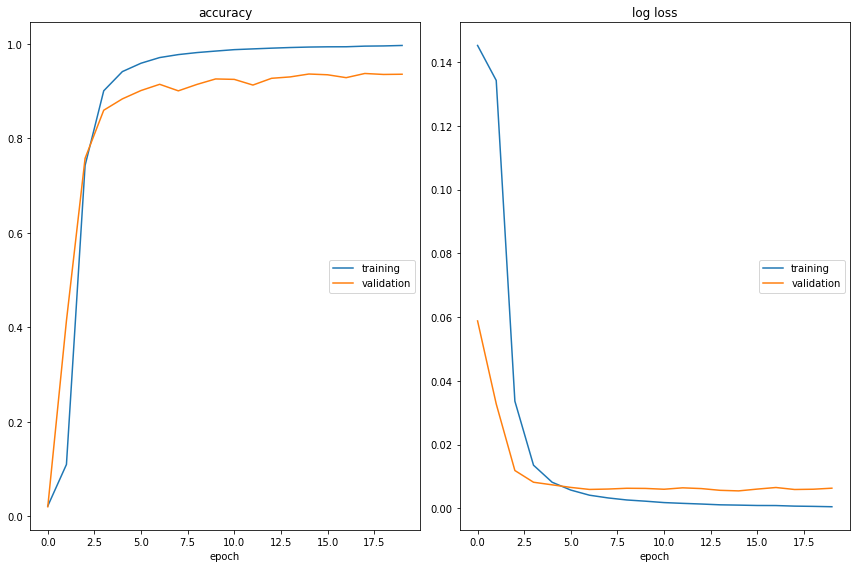

accuracy
	training         	 (min:    0.022, max:    0.997, cur:    0.997)
	validation       	 (min:    0.020, max:    0.937, cur:    0.936)
log loss
	training         	 (min:    0.000, max:    0.145, cur:    0.000)
	validation       	 (min:    0.005, max:    0.059, cur:    0.006)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TraffficNet(True).to(device)
model.share_memory() 
train(model, device)

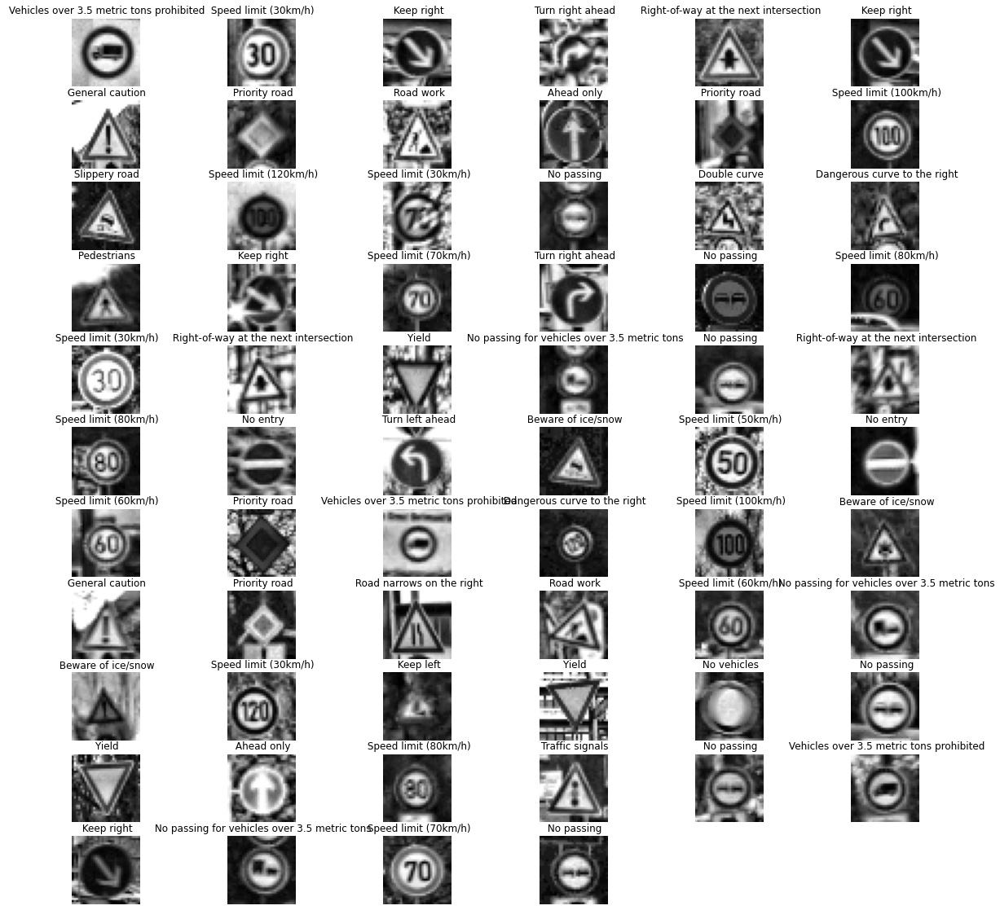

In [ ]:
data_transforms = transforms.Compose([
        ClaheTranform(),
        transforms.ToTensor()
])
test_dataset = PickledTrafficSignsDataset(testing_file, transform=data_transforms)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
for (batch_idx, data) in enumerate(test_loader):
    with torch.no_grad():
        output = model(data[0].to(device))
        pred = torch.argmax(output, dim=1)
        break
        
plt.figure(figsize=(20, 20))
for i in range(len(pred)):
    plt.subplot(11, 6, i+1)
    plt.axis('off')
    plt.title(signal_names.loc[signal_names['ClassId'] == pred[i].cpu().numpy()].SignName.to_string(index=False))
    plt.imshow(np.reshape(data[0][i,...].cpu().numpy(), (-1,32)), cmap='gray')
plt.show()

### Human pose estimation using Deep Learning // Procena ljudske poze pomoću *deep learning*-a

Procena ljudske poze je zadatak obrade fotografije/računarske vizije, koji predviđa različite ključne tačke (mesta zglobova/orijentira - npr. laktovi, kolena, vrat, rame, kukovi i grudi) u ljudskom skeletu, predstavljajući pozu (orijentaciju) čoveka (skupovi koordinata su povezani da bi se pronašla ukupna poza osobe). Ekstremitet/par je definisan važećom vezom između dva dela; neke kombinacije dva dela možda ne čine valjane parove.

Procena poza više osoba je teža od procene za jednu osobu, jer nije poznat ni broj ljudi na fotografiji ni lokacije. Kao pristup odozdo prema gore za rešavanje ovog problema, prvo se otkrivaju svi delovi fotografije za sve predstavljene ljude, a zatim se oni delovi koji odgovaraju pojedincima povezuju/grupišu. Popularni pristup odozdo prema gore je mreža *OpenPose* (sa Univerziteta Carnegie Mellon) koja prvo izdvaja karakteristike ulazne fotografije (koristeći prvih nekoliko slojeva VGG19, kao što je prikazano na sledećem dijagramu) koje se unose u dve paralelne grane konvolucionih slojeva. Sledeća tri koraka rezimiraju kako *OpenPose* radi:

1. Lokalizacija ključnih tačaka: Prva grana predviđa sve ključne tačke (skup od 18 mapa pouzdanosti) sa rezultatima pouzdanosti, pri čemu svaka mapa označava određeni deo ljudskog skeleta.

2. Polja afiniteta dela (PAF): Druga grana predviđa dvodimenzionalno vektorsko polje koje se sastoji od skupa od 38 PAF-a koji predstavlja stepen povezanosti između delova. Uzastopne faze poboljšavaju predviđanja svake grane.

3. Pohlepno zaključivanje: Sve ključne tačke povezane su pohlepnim algoritmom (sa dvodelnim grafikonima konstruisanim između parova delova i slabijih veza u grafikonima obrezanim pomoću vrednosti PAF):


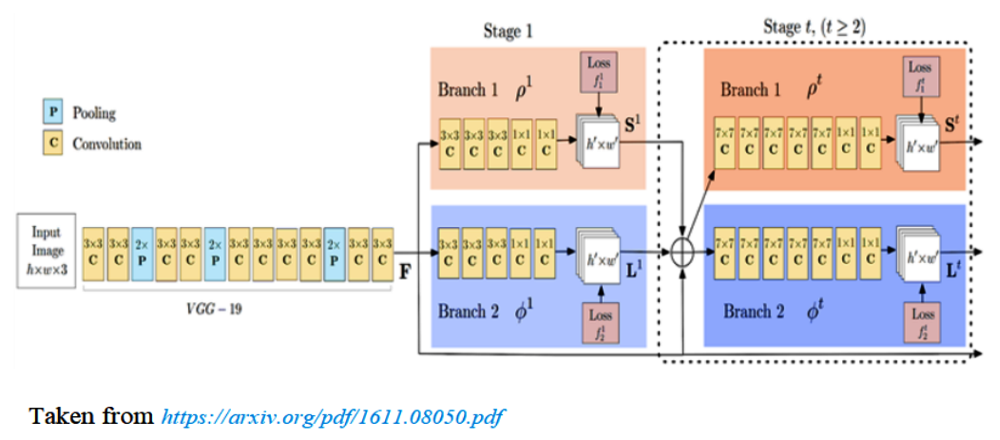

Koristićemo *OpenPose* model duboke neuronske mreže za procenu ljudske poze pomoću prethodno obučenog *Caffe* modela koristeći funkcije biblioteke *opencv-python*.

- Funkcija *cv2.dnn.blobFromImage()* koristi se za pretvaranje fotografije iz *OpenCV* formata u *Caffe blob* format. Prvo se vrednosti piksela normalizuju tako da budu u opsegu (0,1). Tada je data veličina ciljne fotografije koja se menja. Konačno, oduzeta je srednja vrednost. Nije potrebna zamena kanala u boji, jer i *OpenCV* i *Caffe* koriste isti format boje kao BGR.

- Funkcija *cv2.minMaxLoc()* koristi se za izračunavanje lokalnih maksimuma mape pouzdanosti.

In [ ]:
!wget http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/mpi/pose_iter_160000.caffemodel

--2021-04-27 08:35:21--  http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/mpi/pose_iter_160000.caffemodel
Resolving posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)... 128.2.176.37
Connecting to posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)|128.2.176.37|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 205950363 (196M) [text/plain]
Saving to: ‘pose_iter_160000.caffemodel’

pose_iter_160000.ca 100%[===================>] 196.41M  38.6MB/s    in 6.2s    

2021-04-27 08:35:27 (31.6 MB/s) - ‘pose_iter_160000.caffemodel’ saved [205950363/205950363]



In [ ]:
%matplotlib inline
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
from torch.utils import data

#print(cv2.__version__)

"""
Ovaj MPI skup podataka sadrži 15 ključnih tačaka koje odgovaraju različitim delovima ljudskog tela.
Potrebno ih je definisati, a potom i parove poza za ekstremitete koji povezuju ključne tačke. 
Ekstremiteti se predviđaju pomoću mapa afiniteta poza.
"""
n_points = 15
body_parts = {"Head": 0, "Neck": 1, "RShoulder": 2, "RElbow": 3, "RWrist": 4, 
              "LShoulder": 5,  "LElbow": 6, "LWrist": 7, "RHip": 8, "RKnee": 9,
             "RAnkle": 10, "LHip": 11, "LKnee": 12, "LAnkle": 13, "Chest": 14, "Background": 15}

pose_parts = [ ["Head", "Neck"], ["Neck", "RShoulder"], ["RShoulder", "RElbow"],
             ["RElbow", "RWrist"], ["Neck", "LShoulder"], ["LShoulder", "LElbow"],
             ["LElbow", "LWrist"], ["Neck", "Chest"], ["Chest", "RHip"], ["RHip", "RKnee"],
             ["RKnee", "RAnkle"], ["Chest", "LHip"], ["LHip", "LKnee"], ["LKnee", "LAnkle"] ]

"""
Učitajte prethodno obučeni model (obučen na Caffe framework-u) koji ste preuzeli. 
Postoji nekoliko datoteka koje Caffe modeli imaju - .prototkt datoteku (koja opisuje arhitekturu modela neuronske mreže) 
i .caffemodel datoteku (čuvanje težina obučenog modela).
"""
proto_file = "models/pose_deploy_linevec_faster_4_stages.prototxt"
weights_file = "pose_iter_160000.caffemodel"
net = cv2.dnn.readNetFromCaffe(proto_file, weights_file)

# Učitajmo ulaznu fotografiju sa čovekom/ljudima čiju ćemo pozu proceniti. Pripremite ulaz za prosleđivanje mreži.
image = cv2.imread("images/leander.png")
height, width = image.shape[:2]
blob = cv2.dnn.blobFromImage(image, 1.0 / 255, (368,368), (0, 0, 0), swapRB=False, crop=False)
net.setInput(blob)

# Predviđanja modela mogu se generisati samo pokretanjem prosleđivanja na modelu neuronske mreže sa ulaznom fotografijom koja se dovodi u mrežu
output = net.forward()

"""
Rezultat je matrica sa četiri dimenzije. Sadržaj i dimenzije su sledeći:
- ID fotografije (potreban je kada se u model unosi više fotografija).
- Indeksi ključnih tačaka. Model generiše spojene mape pouzdanosti i delimičnih afiniteta kao izlaz. 
(Za MPI model proizvodi 44 tačke, što odgovara 15  ključnih tačaka mape pouzdanosti + 1 pozadina + 14 x 2 mape afiniteta.) 
- Visina izlazne mape.
- Širina izlazne mape.
"""

'\nRezultat je matrica sa četiri dimenzije. Sadržaj i dimenzije su sledeći:\n- ID fotografije (potreban je kada se u model unosi više fotografija).\n- Indeksi ključnih tačaka. Model generiše spojene mape pouzdanosti i delimičnih afiniteta kao izlaz. \n(Za MPI model proizvodi 44 tačke, što odgovara 15  ključnih tačaka mape pouzdanosti + 1 pozadina + 14 x 2 mape afiniteta.) \n- Visina izlazne mape.\n- Širina izlazne mape.\n'

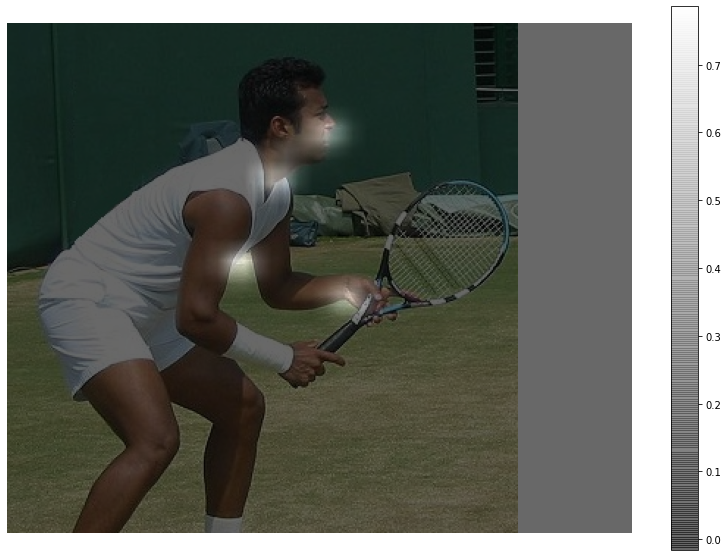

In [ ]:
# Prikaz mape pouzdanosti ključnih tačaka za prvih pet tačaka

h, w = output.shape[2:4]

plt.figure(figsize=[14,10])
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
prob_map = np.zeros((width, height))
for i in range(1,5):
    pmap = output[0, i, :, :]
    prob_map += cv2.resize(pmap, (height, width))
plt.imshow(prob_map, alpha=0.6)
plt.colorbar()
plt.axis("off")
plt.show()

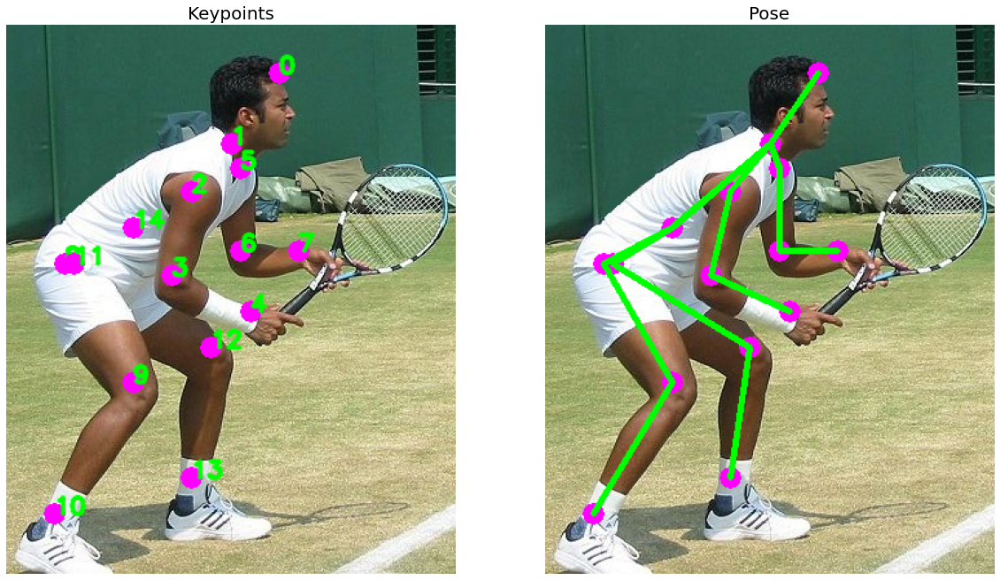

In [ ]:
"""
Za svaku ključnu tačku proverite prisustvo ključne tačke na fotografiji i 
preuzmite koordinate ključne tačke koje odgovaraju maksimumu mape pouzdanosti iz te ključne tačke 
(zajedno sa pragom koji će se koristiti za smanjenje lažnih pozitivnih rezultata).
"""

threshold = 0.1
image1 = image.copy()

# Prazna lista za čuvanje otkrivenih tačaka
points = []

for i in range(n_points):
    # Mapa pouzdanosti odgovarajućeg dela tela
    prob_map = output[0, i, :, :]

    # Pronađite lokalne maksimume prob_map
    min_val, prob, min_loc, point = cv2.minMaxLoc(prob_map)
    
    # Skalirajte tačku tako da stane na originalnu fotografiju
    x = (width * point[0]) / w
    y = (height * point[1]) / h

    if prob > threshold : 
        cv2.circle(image1, (int(x), int(y)), 8, (255, 0, 255), thickness=-1, lineType=cv2.FILLED)
        cv2.putText(image1, "{}".format(i), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2, lineType=cv2.LINE_AA)
        cv2.circle(image, (int(x), int(y)), 8, (255, 0, 255), thickness=-1, lineType=cv2.FILLED)

        # Dodajte tačku na listu ako je verovatnoća veća od praga
        points.append((int(x), int(y)))
    else :
        points.append(None)

# Iscrtavanje skeleta
for pair in pose_parts:
    part_from = body_parts[pair[0]]
    part_to = body_parts[pair[1]]

    if points[part_from] and points[part_to]:
        cv2.line(image, points[part_from], points[part_to], (0, 255, 0), 3)

plt.figure(figsize=[20,12])
plt.subplot(121), plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Keypoints', size=20)
plt.subplot(122), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.axis('off'), plt.title('Pose', size=20)
plt.show()

## Korisni linkovi

1.   [sklearn.linear_model.LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn.linear_model.LogisticRegression)

2.   [Image Classification](https://www.sciencedirect.com/topics/computer-science/image-classification)

3.   [Softmax Regression](http://deeplearning.stanford.edu/tutorial/supervised/SoftmaxRegression/)

4.   [Gabor filter banks for texture classification](https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_gabor.html)

5.   [Tutorial on Gabor Filters](https://web.archive.org/web/20180127125930/http://mplab.ucsd.edu/tutorials/gabor.pdf), Javier R. Movellan

6.   [Image Classification](https://cs231n.github.io/classification/)

7.   [Rethinking the Inception Architecture for Computer Vision](https://arxiv.org/pdf/1512.00567.pdf)

8.   [MobileNetV2: Inverted Residuals and Linear Bottlenecks](https://arxiv.org/pdf/1801.04381.pdf)

9.   [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385.pdf)

10.   [Image Classification using Pre-trained models](https://learnopencv.com/pytorch-for-beginners-image-classification-using-pre-trained-models/)

11.   [Keras Tutorial : Fine-tuning using pre-trained models](https://learnopencv.com/keras-tutorial-fine-tuning-using-pre-trained-models/)


## Reference

1.   [Python Image Processing Cookbook](https://www.amazon.com/Python-Image-Processing-Cookbook-processing-ebook/dp/B084ZN7Y5F), Sandipan Dey




## TO DO

### Zadatak 1

- Zadatak koji je kreiran od strane *Facebook*-a za *PyTorch* stipendiju.
- Napraviti klasifikaciju fotografija cveća upotrebom *transfer learning*-a.
- *Dataset* 102 tipova cveća: https://www.robots.ox.ac.uk/~vgg/data/flowers/102/


**Detaljniji opis zadatka:**

https://medium.com/@bernardt.duvenhage/pytorch-scholarship-challenge-from-facebook-flower-classifier-d3623a9fab7c